# Meme Retrieval System Notebook

This notebook builds a meme retrieval system using the TGIF dataset (100K GIFs, 120K captions). We sample 10K GIFs for speed, but the code is flexible to scale to 100K with minimal changes. All embeddings and indexes are saved locally to avoid rework. The system supports:

- Semantic/emotional matching (e.g., 'feeling excited').
- Reverse image search (upload a meme).
- Query suggestions (emotion-based).
- Mood-based browsing (e.g., 'joy', 'sadness').
- Context-aware suggestions (time-based).
- Interactive retrieval (rate GIFs).

Run cells in order. Each step saves outputs to `embeddings/` for checkpointing. The final app uses Streamlit but is structured for an easy Flask switch later.

**Setup**: Ensure `tgif-v1.0.tsv` is in the project folder and you have ~2 GB free disk space.

## Step 1: Install Dependencies

Install required libraries. Run this once.

In [1]:
%pip install streamlit pandas numpy torch torchvision clip faiss-cpu sentence-transformers transformers requests pillow nltk matplotlib ipywidgets


[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


## Step 2: Initialize Environment

Load libraries, set up paths, and initialize models (CLIP, Sentence-BERT, emotion classifier). This keeps backend logic modular for future Flask use.

In [15]:
import pandas as pd
import numpy as np
import torch
import clip
from PIL import Image
import requests
from io import BytesIO
import faiss
from sentence_transformers import SentenceTransformer
from transformers import pipeline
import os
from datetime import datetime
import nltk
from nltk.stem import PorterStemmer

# Download NLTK data
nltk.download("punkt")
nltk.download("punkt_tab")

# Paths
DATA_FILE = "tgif-v1.0.tsv"
EMBEDDINGS_DIR = "embeddings"
VISUAL_INDEX = os.path.join(EMBEDDINGS_DIR, "index_visual.faiss")
TEXT_INDEX = os.path.join(EMBEDDINGS_DIR, "index_text.faiss")
IMAGE_EMBEDDINGS = os.path.join(EMBEDDINGS_DIR, "image_embeddings.npy")
TEXT_EMBEDDINGS = os.path.join(EMBEDDINGS_DIR, "text_embeddings.npy")
SENTENCE_EMBEDDINGS = os.path.join(EMBEDDINGS_DIR, "sentence_embeddings.npy")
PATHS = os.path.join(EMBEDDINGS_DIR, "paths.npy")
CAPTIONS = os.path.join(EMBEDDINGS_DIR, "captions.npy")
EMOTIONS = os.path.join(EMBEDDINGS_DIR, "emotions.npy")
FEEDBACK_FILE = os.path.join(EMBEDDINGS_DIR, "feedback.csv")

os.makedirs(EMBEDDINGS_DIR, exist_ok=True)

# Initialize models
device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model, preprocess = clip.load("ViT-B/32", device=device)
sentence_model = SentenceTransformer("all-MiniLM-L6-v2")
emotion_classifier = pipeline("text-classification", model="j-hartmann/emotion-english-distilroberta-base", top_k=None, device=device)
stemmer = PorterStemmer()

print("Environment setup complete.")

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/yashbeladiya/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/yashbeladiya/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Environment setup complete.


## Step 3: Load and Sample TGIF Data

Load `tgif-v1.0.tsv` and sample 10K GIFs for speed. The `sample_size` parameter makes it easy to scale to 100K later (just change to 100000).

In [16]:
# Load data
def load_data(sample_size=10000):
    df = pd.read_csv(DATA_FILE, sep="\t", header=None, names=['url', 'caption'])
    return df.sample(n=min(sample_size, len(df)), random_state=42)

df = load_data(sample_size=100000)
print(f"Loaded {len(df)} samples.")
df.head()

Loaded 100000 samples.


,url,caption
99563,https://38.media.tumblr.com/467c51159d4134fd50...,a man spoke in a microphone to four other boys
82611,https://38.media.tumblr.com/8262a10a2eea83485a...,"a woman, wearing a hat, is staring at her refl..."
83204,https://33.media.tumblr.com/8e8682376a9e2bd5b7...,a white man with white shirt is dancing
24327,https://31.media.tumblr.com/ac99c8f0710955be7f...,a man places a chalice on a tray.
15365,https://33.media.tumblr.com/b5f1fb09f338aae7e9...,a man is writing on a white board and it is tr...


## Step 4: Compute Embeddings

Fetch GIFs via URLs, compute CLIP image/text embeddings, Sentence-BERT embeddings, and emotion tags. Save everything to `embeddings/`. This takes ~1–2 hours for 10K GIFs but is cached for future runs.

In [17]:
from multiprocessing import Pool
from functools import partial

def fetch_image(url):
    try:
        response = requests.get(url, timeout=5)
        return Image.open(BytesIO(response.content)).convert("RGB")
    except Exception as e:
        print(f"Failed to fetch image from {url}: {e}")
        return None

def process_row(row, stemmed_keywords, device=device):
    image = fetch_image(row['url'])
    if image is None:
        return None

    image_input = preprocess(image).unsqueeze(0).to(device)
    with torch.no_grad():
        image_emb = clip_model.encode_image(image_input).cpu().numpy()

    text_input = clip.tokenize([row['caption'][:77]]).to(device)
    with torch.no_grad():
        text_emb = clip_model.encode_text(text_input).cpu().numpy()

    sentence_emb = sentence_model.encode(row['caption'])

    emotion_scores = emotion_classifier(row['caption'])[0]
    top_emotion_dict = max(emotion_scores, key=lambda x: x['score'])
    caption_lower = row['caption'].lower()
    caption_words = nltk.word_tokenize(caption_lower)
    stemmed_caption = [stemmer.stem(word) for word in caption_words]
    if any(stemmed_word in stemmed_keywords for stemmed_word in stemmed_caption):
        emotion = 'joy' if top_emotion_dict['score'] > 0.8 else 'neutral'
    else:
        emotion = top_emotion_dict['label'] if top_emotion_dict['score'] > 0.8 else 'neutral'

    return (image_emb, text_emb, sentence_emb, row['url'], row['caption'], emotion)

def compute_embeddings_parallel(df, num_workers=4):
    image_embs, text_embs, sentence_embs, paths, captions, emotions = [], [], [], [], [], []
    positive_keywords = ['laugh', 'smile', 'happy', 'excited', 'joy', 'surprise', 'fun',
                        'party', 'celebrate', 'dance', 'wine', 'dinner', 'festive']
    stemmed_keywords = [stemmer.stem(kw) for kw in positive_keywords]

    with Pool(num_workers) as pool:
        results = pool.map(partial(process_row, stemmed_keywords=stemmed_keywords), df.to_dict('records'))

    for result in results:
        if result is None:
            continue
        img_emb, txt_emb, sent_emb, path, cap, emo = result
        image_embs.append(img_emb)
        text_embs.append(txt_emb)
        sentence_embs.append(sent_emb)
        paths.append(path)
        captions.append(cap)
        emotions.append(emo)

    return (np.vstack(image_embs), np.vstack(text_embs), np.vstack(sentence_embs),
            np.array(paths), np.array(captions), np.array(emotions))

In [19]:
   
# def compute_embeddings(df):
#     image_embs = []
#     text_embs = []
#     sentence_embs = []
#     paths = []
#     captions = []
#     emotions = []

#     positive_keywords = ['laugh', 'smile', 'happy', 'excited', 'joy', 'surprise', 'fun',
#                         'party', 'celebrate', 'dance', 'wine', 'dinner', 'festive']
#     stemmed_keywords = [stemmer.stem(kw) for kw in positive_keywords]

#     counter = 0
#     for idx, row in df.iterrows():
#         print(f"Processing {counter}/{len(df)}: {row['caption']}")
#         image = fetch_image(row['url'])
#         if image is None:
#             continue

#         image_input = preprocess(image).unsqueeze(0).to(device)
#         with torch.no_grad():
#             image_emb = clip_model.encode_image(image_input).cpu().numpy()
#         image_embs.append(image_emb)

#         # Text embeddings (CLIP)
#         text_input = clip.tokenize([row['caption'][:77]]).to(device)
#         with torch.no_grad():
#             text_emb = clip_model.encode_text(text_input).cpu().numpy()
#         text_embs.append(text_emb)

#         # Sentence embeddings 
#         sentence_emb = sentence_model.encode(row['caption'])
#         sentence_embs.append(sentence_emb)

#         # Emotion classification
#         emotion_scores = emotion_classifier(row['caption'])[0]
#         top_emotion_dict = max(emotion_scores, key=lambda x: x['score'])
#         caption_lower = row['caption'].lower()
#         caption_words = nltk.word_tokenize(caption_lower)
#         stemmed_caption = [stemmer.stem(word) for word in caption_words]
#         if any(stemmed_word in stemmed_keywords for stemmed_word in stemmed_caption):
#             emotion = 'joy' if top_emotion_dict['score'] > 0.7 else 'neutral'
#         else:
#             emotion = top_emotion_dict['label'] if top_emotion_dict['score'] > 0.7 else 'neutral'
#         emotions.append(emotion)

#         # Store paths and captions
#         paths.append(row['url'])
#         captions.append(row['caption'])
#         counter += 1

#     return (np.vstack(image_embs), np.vstack(text_embs), np.vstack(sentence_embs),
#             np.array(paths), np.array(captions), np.array(emotions))

if not all(os.path.exists(x) for x in [IMAGE_EMBEDDINGS, TEXT_EMBEDDINGS, SENTENCE_EMBEDDINGS, PATHS, CAPTIONS, EMOTIONS]):
    # Replace compute_embeddings call
    image_embs, text_embs, sentence_embs, paths, captions, emotions = compute_embeddings(df)
    # image_embs, text_embs, sentence_embs, paths, captions, emotions = compute_embeddings(df)
    np.save(IMAGE_EMBEDDINGS, image_embs)
    np.save(TEXT_EMBEDDINGS, text_embs)
    np.save(SENTENCE_EMBEDDINGS, sentence_embs)
    np.save(PATHS, paths)
    np.save(CAPTIONS, captions)
    np.save(EMOTIONS, emotions)
    print("Embeddings computed and saved.")
else:
    image_embs = np.load(IMAGE_EMBEDDINGS)
    text_embs = np.load(TEXT_EMBEDDINGS)
    sentence_embs = np.load(SENTENCE_EMBEDDINGS)
    paths = np.load(PATHS, allow_pickle=True)
    captions = np.load(CAPTIONS, allow_pickle=True)
    emotions = np.load(EMOTIONS, allow_pickle=True)
    print("Embeddings loaded from disk.")

print(f"Processed {len(paths)} images.")

Processing batch 1/3126 (0/100000 GIFs)
Trying https://38.media.tumblr.com/467c51159d4134fd5054594411208f72/tumblr_nekwt1YC7s1tacycfo1_400.gif
Processed GIF 1/100000: a man spoke in a microphone to four other boys...
Trying https://38.media.tumblr.com/8262a10a2eea83485a803ed1e2c0fe89/tumblr_nkb5qjD7Bz1u333yco1_1280.gif
Processed GIF 2/100000: a woman, wearing a hat, is staring at her reflecti...
Trying https://33.media.tumblr.com/8e8682376a9e2bd5b72cb8d87593adf2/tumblr_nf3bpy2aRY1rht00mo1_400.gif
Processed GIF 3/100000: a white man with white shirt is dancing...
Trying https://31.media.tumblr.com/ac99c8f0710955be7f33ef917d252e52/tumblr_nlxchvcT421txd6p7o1_500.gif
Processed GIF 4/100000: a man places a chalice on a tray....
Trying https://33.media.tumblr.com/b5f1fb09f338aae7e9d3d6549fdc3238/tumblr_nq18fhY3JU1qax99wo1_250.gif
Processed GIF 5/100000: a man is writing on a white board and it is transf...
Trying https://33.media.tumblr.com/ac8f31397dfc279ff2476e0f090b0c23/tumblr_nl3cxnXrtW1

## Step 5: Build FAISS Indexes

Create FAISS indexes for image and text embeddings. Save to `embeddings/` for fast retrieval.


In [20]:
def build_indexes(image_embs, text_embs):
    """
    Build FAISS indexes for image and text embeddings.
    """
    dim = image_embs.shape[1]
    index_visual = faiss.IndexFlatL2(dim)
    index_visual.add(image_embs)
    faiss.write_index(index_visual, VISUAL_INDEX)

    index_text = faiss.IndexFlatL2(dim)
    index_text.add(text_embs)
    faiss.write_index(index_text, TEXT_INDEX)

if not all(os.path.exists(x) for x in [VISUAL_INDEX, TEXT_INDEX]):
    build_indexes(image_embs, text_embs)
    print("Indexes built and saved.")
else:
    print("Indexes already exist on disk.")

Indexes built and saved.


## Step 6: Define Search Functions

Implement functions for text search, image search, query suggestions, mood browsing, contextual suggestions, and feedback. These are modular for use in Streamlit or Flask.

In [21]:
def search_text(query, sentence_embs, paths, captions, emotions, top_k=5):
    query_emotion_scores = emotion_classifier(query)[0]
    query_emotion = max(query_emotion_scores, key=lambda x: x['score'])['label']

    text_input = clip.tokenize([query[:77]]).to(device)
    with torch.no_grad():
        query_emb = clip_model.encode_text(text_input).cpu().numpy()

    query_sentence_emb = sentence_model.encode(query)

    index_text = faiss.read_index(TEXT_INDEX)
    distances, indices = index_text.search(query_emb, top_k * 2)

    results = []
    for idx in indices[0]:
        emo_score = 1.0 if emotions[idx] == query_emotion else 0.5
        sem_score = np.dot(query_sentence_emb, sentence_embs[idx]) / (np.linalg.norm(query_sentence_emb) * np.linalg.norm(sentence_embs[idx]))

        score = 0.5 * emo_score + 0.5 * sem_score
        results.append((idx, score))

    results = sorted(results, key=lambda x: x[1], reverse=True)[:top_k]
    return [(paths[idx], captions[idx], emotions[idx]) for idx, _ in results]

def search_image(image, image_embs, paths, captions, emotions, top_k=5):
    img_input = preprocess(image).unsqueeze(0).to(device)
    with torch.no_grad():
        img_emb = clip_model.encode_image(img_input).cpu().numpy()

    index_visual = faiss.read_index(VISUAL_INDEX)
    distances, indices = index_visual.search(img_emb, top_k)

    return [(paths[idx], captions[idx], emotions[idx]) for idx in indices[0]]

def get_query_suggestions(query, captions, sentence_embs, emotions):
    query_emb = sentence_model.encode(query)
    scores = np.dot(sentence_embs, query_emb) / (np.linalg.norm(sentence_embs, axis=1) * np.linalg.norm(query_emb))
    top_indices = np.argsort(scores)[-5:][::-1]
    return list(set([emotions[idx] for idx in top_indices]))

def get_mood_results(mood, paths, captions, emotions, top_k=5):
    indices = np.where(emotions == mood)[0][:top_k]
    return [(paths[idx], captions[idx], emotions[idx]) for idx in indices]

def get_contextual_suggestions(sentence_embs, paths, captions, emotions, top_k=5):
    hour = datetime.now().hour
    target_emotion = "joy" if 18 <= hour <= 23 else "surprise" if 0 <= hour <= 5 else "neutral"
    indices = np.where(emotions == target_emotion)[0][:top_k]
    return [(paths[idx], captions[idx], emotions[idx]) for idx in indices]

def save_feedback(gif_url, rating):
    feedback = pd.DataFrame([[gif_url, rating]], columns=['gif_url', 'rating'])
    if os.path.exists(FEEDBACK_FILE):
        feedback.to_csv(FEEDBACK_FILE, mode='a', header=False, index=False)
    else:
        feedback.to_csv(FEEDBACK_FILE, index=False)
    print(f"Feedback saved: {gif_url} - {rating}")


In [48]:
# Test a Sample Query
sample_results = search_text("excited", sentence_embs, paths, captions, emotions)
print("Sample results for 'e brokeh':")

for url, caption, emotion in sample_results:
    print(f"URL: {url}, Caption: {caption}, Emotion: {emotion}")

Sample results for 'he broke':
URL: https://33.media.tumblr.com/2de1751fb2aa7ad0a4438c8e86f9b1df/tumblr_noz1zf4We11u8y6wqo1_250.gif, Caption: a dark-haired girl is shaking her head., Emotion: fear
URL: https://31.media.tumblr.com/f4deb481ff812ab4e8957fb8a323ed28/tumblr_nc33ff7Nhn1sht3fmo1_250.gif, Caption: a man are shaking his head in a room, Emotion: fear
URL: https://33.media.tumblr.com/c66d203b59e441d4bf73516de4fcde62/tumblr_njo9npiBPU1u2qfs8o1_400.gif, Caption: a man has his mouth wide open because he is surprised, Emotion: joy
URL: https://38.media.tumblr.com/bcf12c5eac944218efbe4d5049985b4f/tumblr_nhnvqr5LfI1s5i7h6o1_500.gif, Caption: a man shakes his head and this smirks, Emotion: neutral
URL: https://33.media.tumblr.com/941ddfed98e275e0a03eeff5a5494cb4/tumblr_nanynyWhb81rjzdx9o1_400.gif, Caption: a man is shaking his head and yelling., Emotion: neutral


## Step 7: Create Streamlit App

Build a Streamlit app to demo all features. The backend logic (search functions) is modular, so you can reuse it with Flask later by wrapping in API endpoints.

In [34]:
%%writefile app.py

import streamlit as st
import pandas as pd
import numpy as np
import torch
import clip
from PIL import Image
import requests
from io import BytesIO
import faiss
from sentence_transformers import SentenceTransformer
from transformers import pipeline
import os
from datetime import datetime

# Initialize models
device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model, preprocess = clip.load("ViT-B/32", device=device)
sentence_model = SentenceTransformer("all-MiniLM-L6-v2")
emotion_classifier = pipeline("text-classification", model="j-hartmann/emotion-english-distilroberta-base", top_k=None)

# Paths
EMBEDDINGS_DIR = "embeddings"
VISUAL_INDEX = os.path.join(EMBEDDINGS_DIR, "index_visual.faiss")
TEXT_INDEX = os.path.join(EMBEDDINGS_DIR, "index_text.faiss")
IMAGE_EMBEDDINGS = os.path.join(EMBEDDINGS_DIR, "image_embeddings.npy")
TEXT_EMBEDDINGS = os.path.join(EMBEDDINGS_DIR, "text_embeddings.npy")
SENTENCE_EMBEDDINGS = os.path.join(EMBEDDINGS_DIR, "sentence_embeddings.npy")
PATHS = os.path.join(EMBEDDINGS_DIR, "paths.npy")
CAPTIONS = os.path.join(EMBEDDINGS_DIR, "captions.npy")
EMOTIONS = os.path.join(EMBEDDINGS_DIR, "emotions.npy")
FEEDBACK_FILE = os.path.join(EMBEDDINGS_DIR, "feedback.csv")

# Load data
def load_data_st():
    image_embs = np.load(IMAGE_EMBEDDINGS)
    text_embs = np.load(TEXT_EMBEDDINGS)
    sentence_embs = np.load(SENTENCE_EMBEDDINGS)
    paths = np.load(PATHS, allow_pickle=True)
    captions = np.load(CAPTIONS, allow_pickle=True)
    emotions = np.load(EMOTIONS, allow_pickle=True)
    return image_embs, text_embs, sentence_embs, paths, captions, emotions

# Search functions
def search_text(query, sentence_embs, paths, captions, emotions, top_k=5):
    query_emotion_scores = emotion_classifier(query)[0]
    query_emotion = max(query_emotion_scores, key=lambda x: x['score'])['label']

    text_input = clip.tokenize([query[:77]]).to(device)
    with torch.no_grad():
        query_emb = clip_model.encode_text(text_input).cpu().numpy()

    query_sentence_emb = sentence_model.encode(query)

    index_text = faiss.read_index(TEXT_INDEX)
    distances, indices = index_text.search(query_emb, top_k * 2)

    results = []
    for idx in indices[0]:
        emo_score = 1.0 if emotions[idx] == query_emotion else 0.5
        sem_score = np.dot(query_sentence_emb, sentence_embs[idx]) / (np.linalg.norm(query_sentence_emb) * np.linalg.norm(sentence_embs[idx]))
        score = 0.5 * emo_score + 0.5 * sem_score
        results.append((idx, score))

    results = sorted(results, key=lambda x: x[1], reverse=True)[:top_k]
    return [(paths[idx], captions[idx], emotions[idx]) for idx, _ in results]

def search_image(image, image_embs, paths, captions, emotions, top_k=5):
    img_input = preprocess(image).unsqueeze(0).to(device)
    with torch.no_grad():
        img_emb = clip_model.encode_image(img_input).cpu().numpy()

    index_visual = faiss.read_index(VISUAL_INDEX)
    distances, indices = index_visual.search(img_emb, top_k)

    return [(paths[idx], captions[idx], emotions[idx]) for idx in indices[0]]

def get_query_suggestions(query, captions, sentence_embs, emotions):
    query_emb = sentence_model.encode(query)
    scores = np.dot(sentence_embs, query_emb) / (np.linalg.norm(sentence_embs, axis=1) * np.linalg.norm(query_emb))
    top_indices = np.argsort(scores)[-5:][::-1]
    return list(set([emotions[idx] for idx in top_indices]))

def get_mood_results(mood, paths, captions, emotions, top_k=5):
    indices = np.where(emotions == mood)[0][:top_k]
    return [(paths[idx], captions[idx], emotions[idx]) for idx in indices]

def get_contextual_suggestions(sentence_embs, paths, captions, emotions, top_k=5):
    hour = datetime.now().hour
    target_emotion = "joy" if 18 <= hour <= 23 else "surprise" if 0 <= hour <= 5 else "neutral"
    indices = np.where(emotions == target_emotion)[0][:top_k]
    return [(paths[idx], captions[idx], emotions[idx]) for idx in indices]

def save_feedback(gif_url, rating):
    feedback = pd.DataFrame([[gif_url, rating]], columns=['gif_url', 'rating'])
    if os.path.exists(FEEDBACK_FILE):
        feedback.to_csv(FEEDBACK_FILE, mode='a', header=False, index=False)
    else:
        feedback.to_csv(FEEDBACK_FILE, index=False)
    print(f"Feedback saved: {gif_url} - {rating}")

def main():
    st.title("Meme Retrieval System")
    with st.spinner("Loading data ..."):
        image_embs, text_embs, sentence_embs, paths, captions, emotions = load_data_st()

    tab1, tab2, tab3 = st.tabs(["Search by Text", "Search by Image", "Mood Browser"])

    with tab1:
        st.header("Search by Text")
        query = st.text_input("Enter your query (e.g., 'feeling excited'):")
        if query:
            results = search_text(query, sentence_embs, paths, captions, emotions)
            st.write("### Results:")
            for url, caption, emotion in results:
                st.image(url, caption=f"{caption} ({emotion})", use_container_width=True)
                rating = st.radio(f"Rate: {caption}", ["✅ On Point", "🤔 relatable", "❌ meh"], key=url, horizontal=True)
                submit_button = st.button("Submit Feedback", key=f"submit_{url}")
                if submit_button and rating:
                    save_feedback(url, rating)
                    st.success("Feedback submitted!")

                suggestions = get_query_suggestions(query, captions, sentence_embs, emotions)

                st.write("### Try these emotions:", ", ".join(suggestions))

    with tab2:
        st.header("Search by Image")
        uploaded_file = st.file_uploader("Upload an image", type=["gif", "jpeg", "png", "jpg"])
        if uploaded_file:
            image = Image.open(uploaded_file)
            st.image(image, caption="Uploaded Image", width = 300)
            results = search_image(image, image_embs, paths, captions, emotions)
            st.write("### Similar Memes:")
            for url, caption, emotion in results:
                st.image(url, caption=f"{caption} ({emotion})", use_container_width=True)
                rating = st.radio(f"Rate: {caption}", ["✅ On Point", "🤔 relatable", "❌ meh"], key=url, horizontal=True)
                submit_button = st.button("Submit Feedback", key=f"submit_{url}")
                if submit_button and rating:
                    save_feedback(url, rating)
                    st.success("Feedback submitted!")

    with tab3:
        st.header("Mood Browser")
        mood = st.selectbox("Pick a mood", ["joy", "sadness", "anger", "fear", "surprise", "disgust"])
        
        if mood:
            results = get_mood_results(mood, paths, captions, emotions)
            st.write("### Memes for your mood:")
            for url, caption, emotion in results:
                st.image(url, caption=f"{caption} ({emotion})", use_container_width=True)
                rating = st.radio(f"Rate: {caption}", ["✅ On Point", "🤔 relatable", "❌ meh"], key=url, horizontal=True)
                submit_button = st.button("Submit Feedback", key=f"submit_{url}")
                if submit_button and rating:
                    save_feedback(url, rating)
                    st.success("Feedback submitted!")

    st.sidebar.write("### Trending Now")
    contextual_results = get_contextual_suggestions(sentence_embs, paths, captions, emotions)
    for url, caption, emotion in contextual_results:
        st.sidebar.image(url, caption=f"{caption} ({emotion})", use_container_width=True)
        
if __name__ == "__main__":
    main()


Overwriting app.py


## Step 8: Run Streamlit App

Launch the demo. Search functions can be reused in Flask later (e.g., `/search/text` endpoint).

In [35]:
!streamlit run app.py

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)



  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://10.0.0.124:8501

  For better performance, install the Watchdog module:

  $ xcode-select --install
  $ pip install watchdog
            
Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.
2025-04-15 08:26:57.178 Examining the path of torch.classes raised:
Traceback (most recent call last):
  File "/Users/yashbeladiya/myenv/lib/python3.12/site-packages/streamlit/web/bootstrap.py", line 347, in run
    if asyncio.get_running_loop().is_running():
       ^^^^^^^^^^^^^^^^^^^^^^^^^^
RuntimeError: no running event loop

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Users/yashbeladiya/myenv/lib/python3.12/site-packages/streamlit/watcher/local_sources_watcher.py", line 217, in get_module_paths
    potential_paths = extract

## Step 9: Evaluate

Evaluate the system using **MAP@5** and **NDCG@5** on 5 test queries, addressing professor's feedback on relevance metrics. Manually annotate top-5 results as relevant (1) or irrelevant (0). Discuss challenges (subjectivity, no ground truth).

**Why Metrics Are Challenging**:
- **Subjectivity**: Relevance is subjective; different users may find different memes relevant.
- **No Ground Truth**: No established ground truth for meme relevance; manual annotation is necessary.
- **Emotional Ambiguity**: Memes can evoke different emotions in different contexts. 
- **Cultural Context**: Memes often rely on cultural references that may not be universally understood.
- **Query Variability**: Short queries ('excited!') yield weaker embeddings than phrases ('feeling sad').
- **Dataset Limitations**: TGIF dataset may not cover all meme types or emotions.
- **Dynamic Nature of Memes**: Memes evolve rapidly; what is relevant today may not be tomorrow.

**Annotation Guide**:
- Run each query below and view top-5 results (URL, caption, emotion).
- Label each result: 1 = relevant (matches query intent/emotion), 0 = irrelevant.
- Example: For 'excited!': 'people dancing' (joy) = 1, 'car driving' (neutral) = 0.
- Takes ~30–60 minutes for 5 queries × 5 results.

In [7]:
test_queries = ["lerning", "feeling excited", "happy", "sad", "angry", "surprised"]

In [24]:
test_queries = ["super thrilled", "really upset", "hilarious moment", "calm and peaceful", "shocked reaction", "party vibe", "feeling lonely"]

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output, Image

# 1. Global annotations store
annotations = {}

# 2. This function you call manually for each query
def run_interactive_annotation(query, results):
    output_area = widgets.Output()
    current_annotations = []
    result_idx = 0

    def show_next_result():
        nonlocal result_idx

        with output_area:
            clear_output()

            if result_idx >= len(results):
                annotations[query] = current_annotations
                print(f"✅ Finished annotating query: '{query}'")
                return

            url, caption, emotion = results[result_idx]

            print(f"Query: {query}")
            print(f"{result_idx + 1}. Caption: {caption}")
            print(f"Emotion: {emotion}")
            print(f"URL: {url}")

            try:
                display(Image(url=url))
            except Exception as e:
                print(f"⚠️ Could not load image: {e}")

            dropdown = widgets.Dropdown(
                options=[('Relevant ✅', 1), ('Not Relevant ❌', 0)],
                description='Relevance:'
            )
            button = widgets.Button(description='Submit')

            def on_submit(_):
                nonlocal result_idx
                rel = dropdown.value
                current_annotations.append((url, caption, emotion, rel))
                result_idx += 1
                show_next_result()

            button.on_click(on_submit)
            display(dropdown, button)

    show_next_result()
    display(output_area)

# 3. Run the function for each query
    
for query in test_queries:
    results = search_text(query, sentence_embs, paths, captions, emotions)
    run_interactive_annotation(query, results)
    

Output()

Output()

Output()

Output()

Output()

Output()

Output()

In [28]:
# load the annotations
annotations_df = pd.DataFrame([(k, *v) for k, vals in annotations.items() for v in vals], columns=['query', 'url', 'caption', 'emotion', 'relevance'])
# annotations_df.to_csv('annotations.csv', index=False)
annotations_df.head()

,query,url,caption,emotion,relevance
0,super thrilled,https://38.media.tumblr.com/e20d1510dfb260c098...,a man looks forward and smirks his mouth slyly,neutral,0
1,super thrilled,https://38.media.tumblr.com/e92371c163a76591fe...,someone is looking upset and running their han...,anger,0
2,super thrilled,https://38.media.tumblr.com/cbc8e9c7bd2f3144f9...,a man is shaking his head in disappointment,neutral,0
3,super thrilled,https://38.media.tumblr.com/8e4df8454424b56827...,the girl is shaking her head in disbelief,fear,0
4,super thrilled,https://31.media.tumblr.com/214cd9e705dc0c72dc...,a man is shaking his head and chuckling.,neutral,0


In [29]:
print(annotations)

{'super thrilled': [(np.str_('https://38.media.tumblr.com/e20d1510dfb260c098668c80fa923139/tumblr_nkp7mqCKHx1uppiwbo1_500.gif'), np.str_('a man looks forward and smirks his mouth slyly'), np.str_('neutral'), 0), (np.str_('https://38.media.tumblr.com/e92371c163a76591fe8710ba79f8e844/tumblr_nqcs7ehbaA1uxwigro2_500.gif'), np.str_('someone is looking upset and running their hands down their face'), np.str_('anger'), 0), (np.str_('https://38.media.tumblr.com/cbc8e9c7bd2f3144f970705b75f55652/tumblr_nc211e0fkp1sht3fmo1_250.gif'), np.str_('a man is shaking his head in disappointment'), np.str_('neutral'), 0), (np.str_('https://38.media.tumblr.com/8e4df8454424b56827b18594a25c2283/tumblr_nadlu6mume1t5ojzdo1_250.gif'), np.str_('the girl is shaking her head in disbelief'), np.str_('fear'), 0), (np.str_('https://31.media.tumblr.com/214cd9e705dc0c72dca3901f0ac20a7e/tumblr_nk6xlru8lW1uo3y35o1_400.gif'), np.str_('a man is shaking his head and chuckling.'), np.str_('neutral'), 0)], 'really upset': [(np

In [26]:
def compute_map_at_k(results, relevance, k=5):
    """Compute Mean Average Precision at k (MAP@k) for a set of results."""
    if not relevance:
        return 0.0
    precision_sum = 0.0
    relevant_count = 0
    for i in range(min(k, len(relevance))):
        if relevance[i] == 1:
            relevant_count += 1
            precision_sum += relevant_count / (i + 1)
    
    return precision_sum / sum(relevance) if sum(relevance) > 0 else 0.0

def compute_ndcg_at_k(relevance, k=5):
    """Compute Normalized Discounted Cumulative Gain (NDCG) at k."""
    if not relevance:
        return 0.0
    
    dcg = 0.0
    for i in range(min(k, len(relevance))):
        dcg += relevance[i] / np.log2(i + 2)
    
    sorted_relevance = sorted(relevance, reverse=True)
    idcg = sum(sorted_relevance[i] / np.log2(i + 2) for i in range(min(k, len(sorted_relevance))))
    print("idcg ", idcg)
    
    return dcg / idcg if idcg > 0 else 0.0


def evaluate():
    map_scores = []
    ndcg_scores = []
    results_summary = []

    print("Step 1: Run queries and annotate relevance (1 = relevant, 0 = irrelevant)")

    print("\nStep 2: Compute MAP@k and NDCG@k")

    for query in test_queries:
        if not annotations[query]:
            map_scores.append(0.0)
            ndcg_scores.append(0.0)
            continue

        relevance = [item[3] for item in annotations[query]]
        map_score = compute_map_at_k(results, relevance)
        ndcg_score = compute_ndcg_at_k(relevance)
        map_scores.append(map_score)
        ndcg_scores.append(ndcg_score)
        print(f"Query: {query}, MAP@k: {map_score:.4f}, NDCG@k: {ndcg_score}")
        
        # Collect top-2 results for summary
        for item in annotations[query][:2]:
            results_summary.append({
                "query": query,
                "url": item[0],
                "caption": item[1],
                "emotion": item[2],
                "relevance": item[3]
            })

    print("\nStep 3: Summarize metrics")
    metrics_df = pd.DataFrame({
        "Query": test_queries,
        "MAP@k": map_scores,
        "NDCG@k": ndcg_scores
    })
    print("\n Metrics DataFrame:")
    print(metrics_df)
    metrics_df.to_csv(os.path.join(EMBEDDINGS_DIR, "metrics.csv"), index=False)

    print("\nStep 4: Summarize top results")
    results_df = pd.DataFrame(results_summary)

    print("\nTop Results Table:")
    print(results_df[["query", "url", "caption", "emotion", "relevance"]])
    results_df.to_csv(os.path.join(EMBEDDINGS_DIR, "results_summary.csv"), index=False)

    print("\nStep 5: Feedback summary")
    if os.path.exists(FEEDBACK_FILE):
        feedback_df = pd.read_csv(FEEDBACK_FILE)
        print("\nFeedback DataFrame:")
        print(feedback_df['rating'].value_counts())
    else:
        print("No feedback data available.")


evaluate()


Step 1: Run queries and annotate relevance (1 = relevant, 0 = irrelevant)

Step 2: Compute MAP@k and NDCG@k
idcg  0.0
Query: super thrilled, MAP@k: 0.0000, NDCG@k: 0.0
idcg  2.1309297535714578
Query: really upset, MAP@k: 0.8667, NDCG@k: 0.9469024295259745
idcg  2.5616063116448506
Query: hilarious moment, MAP@k: 1.0000, NDCG@k: 1.0
idcg  1.6309297535714575
Query: calm and peaceful, MAP@k: 1.0000, NDCG@k: 1.0
idcg  2.9484591188793923
Query: shocked reaction, MAP@k: 1.0000, NDCG@k: 1.0
idcg  2.9484591188793923
Query: party vibe, MAP@k: 1.0000, NDCG@k: 1.0
idcg  2.1309297535714578
Query: feeling lonely, MAP@k: 1.0000, NDCG@k: 1.0

Step 3: Summarize metrics

 Metrics DataFrame:
               Query     MAP@k    NDCG@k
0     super thrilled  0.000000  0.000000
1       really upset  0.866667  0.946902
2   hilarious moment  1.000000  1.000000
3  calm and peaceful  1.000000  1.000000
4   shocked reaction  1.000000  1.000000
5         party vibe  1.000000  1.000000
6     feeling lonely  1.000000 

## Step 10: Visualize Results

Create visualizations for MAP@5, NDCG@5, and sample results to make the evaluation professional. Saves plots to `embeddings/` for your report.

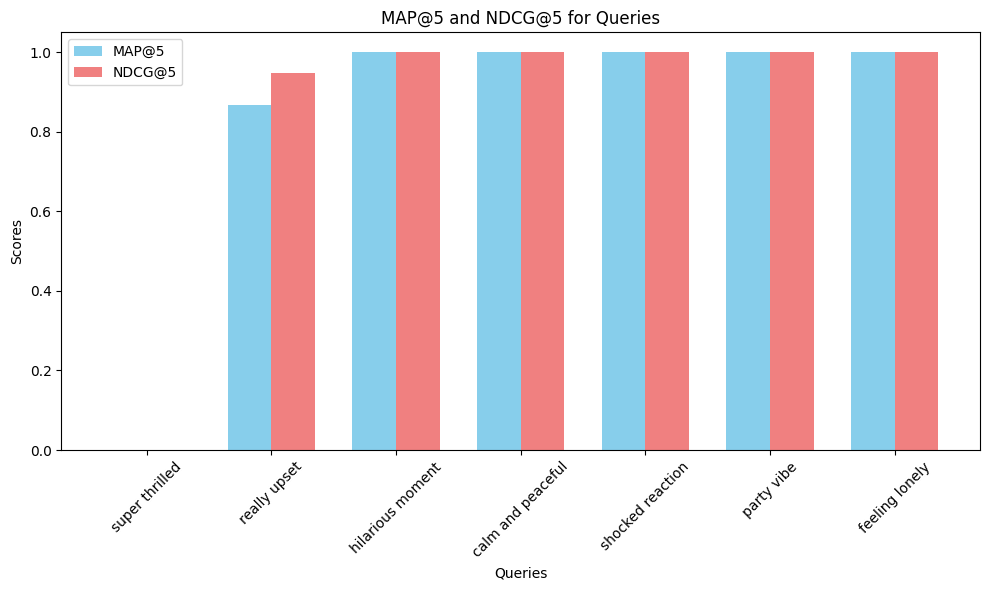

No feedback data available for visualization.


In [27]:

import matplotlib.pyplot as plt
import numpy as np

def visualize_results():
    # Load metrics
    metrics_df = pd.read_csv(os.path.join(EMBEDDINGS_DIR, "metrics.csv"))
    
    # Bar plot for MAP@5 and NDCG@5
    plt.figure(figsize=(10, 6))
    bar_width = 0.35
    index = np.arange(len(metrics_df))
    plt.bar(index, metrics_df['MAP@k'], bar_width, label='MAP@5', color='skyblue')
    plt.bar(index + bar_width, metrics_df['NDCG@k'], bar_width, label='NDCG@5', color='lightcoral')
    plt.xlabel('Queries')
    plt.ylabel('Scores')
    plt.title('MAP@5 and NDCG@5 for Queries')
    plt.xticks(index + bar_width / 2, metrics_df['Query'], rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(EMBEDDINGS_DIR, "metrics_plot.png"))
    plt.show()

    # Feedback plot (if available)
    if os.path.exists(FEEDBACK_FILE):
        feedback_df = pd.read_csv(FEEDBACK_FILE)
        feedback_counts = feedback_df['rating'].value_counts()
        feedback_counts.plot(kind='bar', color='lightgreen')
        plt.title('Feedback Summary')
        plt.xlabel('Rating')
        plt.ylabel('Count')
        plt.xticks(rotation=0)
        plt.tight_layout()
        plt.savefig(os.path.join(EMBEDDINGS_DIR, "feedback_plot.png"))
        plt.show()
    else:
        print("No feedback data available for visualization.")

visualize_results()

In [57]:
def evaluate_feedback():
    """
    Evaluate the model using the feedback data.
    """
    if not os.path.exists(FEEDBACK_FILE):
        print("No feedback data available.")
        return

    feedback_df = pd.read_csv(FEEDBACK_FILE)
    feedback_df['rating'] = feedback_df['rating'].map({"✅ On Point": 1, "🤔 relatable": 0.5, "❌ meh": 0})
    avg_rating = feedback_df.groupby('gif_url')['rating'].mean()
    print("Average ratings:")
    print(avg_rating)

evaluate_feedback()

Average ratings:
gif_url
https://31.media.tumblr.com/326ed99c40ce588125563435e5535d23/tumblr_nhlq5baJlh1u6lzeko1_500.gif     0.00
https://31.media.tumblr.com/5b93db679cad3effa96f903feece4762/tumblr_ngke5xIw9i1u2zq6io1_500.gif     0.50
https://33.media.tumblr.com/2de1751fb2aa7ad0a4438c8e86f9b1df/tumblr_noz1zf4We11u8y6wqo1_250.gif     0.50
https://33.media.tumblr.com/941ddfed98e275e0a03eeff5a5494cb4/tumblr_nanynyWhb81rjzdx9o1_400.gif     0.00
https://33.media.tumblr.com/9809fd62fde889e33842f408a33acbf6/tumblr_nc2duhbFxv1tmqz97o1_250.gif     0.00
https://33.media.tumblr.com/9b27a5c6f5b5228fa3d50f5b507ba71c/tumblr_nfuqfyPA0I1rc6jvuo1_400.gif     0.50
https://33.media.tumblr.com/c0027b897c208ddabab1e0455d05afa3/tumblr_nbe7h9UMrl1tusawco1_1280.gif    0.00
https://33.media.tumblr.com/c66d203b59e441d4bf73516de4fcde62/tumblr_njo9npiBPU1u2qfs8o1_400.gif     0.50
https://38.media.tumblr.com/adc259e684a95e430ffdc94a7ece1070/tumblr_nc77mhBjuN1skxg1lo1_250.gif     1.00
https://38.media.tumblr.com/bc